In [1]:
import librosa
import IPython
import numpy as np
import json
import librosa.display

In [2]:
def Audio(audio: np.ndarray, sr: int):
    """
    Use instead of IPython.display.Audio as a workaround for VS Code.
    `audio` is an array with shape (channels, samples) or just (samples,) for mono.
    """

    if np.ndim(audio) == 1:
        channels = [audio.tolist()]
    else:
        channels = audio.tolist()

    return IPython.display.HTML("""
        <script>
            if (!window.audioContext) {
                window.audioContext = new AudioContext();
                window.playAudio = function(audioChannels, sr) {
                    const buffer = audioContext.createBuffer(audioChannels.length, audioChannels[0].length, sr);
                    for (let [channel, data] of audioChannels.entries()) {
                        buffer.copyToChannel(Float32Array.from(data), channel);
                    }
            
                    const source = audioContext.createBufferSource();
                    source.buffer = buffer;
                    source.connect(audioContext.destination);
                    source.start();
                }
            }
        </script>
        <button onclick="playAudio(%s, %s)">Play</button>
    """ % (json.dumps(channels), sr))

In [25]:
file = '/home/alhasan/workdir/SED/data/ESC-50/raw/no_silence/audio_16k/5-202220-A-21.wav'

In [26]:
y, sr = librosa.load(file)
Audio(y, sr)

In [27]:
y_harmonic, y_percussive = librosa.effects.hpss(y)
Audio(y_percussive, sr)


In [28]:
Audio(y_harmonic, sr)

In [103]:
y_fast = librosa.effects.time_stretch(y, rate=1.5)
Audio(y_fast, sr)

In [111]:
y_third = librosa.effects.pitch_shift(y, sr=sr, n_steps=-5)
Audio(y_third, sr)

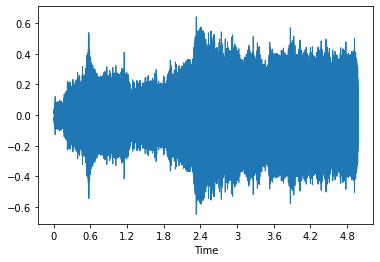

In [112]:
librosa.display.waveshow(y_third,sr=sr)


In [113]:
emph = librosa.effects.preemphasis(y, coef=0.99)
Audio(emph, sr)

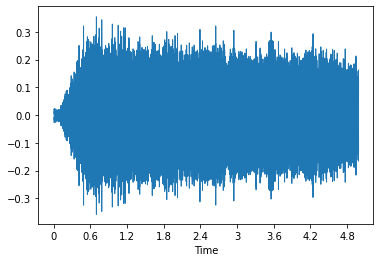

In [114]:
librosa.display.waveshow(emph,sr=sr)


In [115]:
noise=np.random.normal(0, 0.001, len(y))
signal_noise = y+noise
Audio(signal_noise, sr)


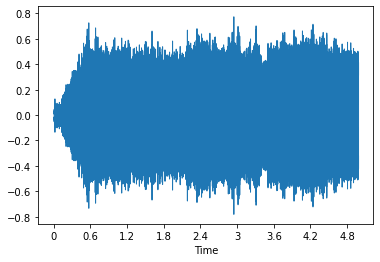

In [116]:
librosa.display.waveshow(signal_noise,sr=sr)



In [ ]:
y_fast = librosa.effects.time_stretch(y, rate=1.5)


In [140]:
x = [np.zeros((2,6)) for _ in range(10)] 

In [142]:
print(.shape)


(20, 6)
